Note: The code in this first cell is a button that toggles code on and off with Jupyter slides.

# Final Capstone - Predicting Kickstarter Success
## Data Scientist - Trey R Boardman


## Executive Summary 
Welcome! This final capstone will explore and analyze project data from Kickstarter and focus on projects in the United States.
This data set is sourced from this [Kaggle page.](https://www.kaggle.com/toshimelonhead/400000-kickstarter-projects)

- __Main objective__: Build and compare classification models that predict project success or failure.

- __Value__: Users will quickly gain high-level insights into successful projects to broadly shape their strategies before deploying their own project(s).

- __Intent__: This project was created to be used as a template. Ideally, users would be able to adapt this workflow to various Kickstarter categories and even other crowd-funding platforms.

- __Modeling numeric data__ - KNN, RandomForest, GradientBoosting <br> __Modeling text data__ - NLP, LogisticRegression, SGDClassifier, Multinomial, LinearSVC

### Background <br>

Kickstarter became a well-known avenue for crowd-sourced projects and inventions in just a few years. With over __500,000 projects, 18.8 million backers, and $5.4 billion dollars__, it has proven to be an inclusive platform for a wide variety of entrepreneurs. However, as with any business venture, there is a chance for failure. This can range anywhere from absolutely no interest to missing the mark by just 1 percent of the funding goal The success rate is approximately __38 percent__, although each category is different. This is where we come in.


__Data__ <br>

The data for this analysis comes from Kickstarter Data that was prescraped and downloaded via this [Kaggle page](https://www.kaggle.com/toshimelonhead/400000-kickstarter-projects). There are a lot of pre-scraped data sets that are easy to download. Early attempts at scraping the website data directly from Kaggle became a difficult task as permissions were not provided and not all of the data required was readily available. Multiple sources were required for the complete data set, which is why I went with the referred page above.

__Use case__

Our clients can use this information to help them with their strategies for best chances of success. Alternatively, they might also come to the conclusion that their project would be more successful with another crowd-funding platform.

In [53]:
# importing packages
import pandas as pd  #using dataframes
import numpy as np  #working numeric data and arrays

# plotting packages
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.tools as tls
import plotly
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

# datetime transformations and timing scripts
from datetime import datetime
#import time
from time import time

# generic stats utilities 
from scipy import stats
from statsmodels.tools.eval_measures import mse, rmse
import statsmodels.api as sm
from collections import Counter

# Import scipy stats packages for tests
from scipy.stats import jarque_bera
from scipy.stats import normaltest
from scipy.stats.stats import ttest_ind
#from scipy.stats import zscore
import scipy.stats as stats

# Libraries
import os

#Importing the auxiliar and preprocessing librarys 
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.pipeline import Pipeline

# dimensionality reduction
from sklearn.decomposition import PCA

# sklearn library and packages
import sklearn.metrics as metrics
#split train/test data and cross validation methods for models
from sklearn.model_selection import train_test_split, KFold, cross_val_score, cross_validate
from sklearn.metrics import mean_absolute_error

from sklearn.metrics import accuracy_score, precision_score, recall_score  #,classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier#, ExtraTreesClassifier, BaggingClassifier, VotingClassifier, RandomTreesEmbedding
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_selection import SelectFromModel


# string manipuation for NLP
import string
import nltk
import re
wn = nltk.WordNetLemmatizer()
stopwords = nltk.corpus.stopwords.words('english')
from sklearn.feature_extraction.text import TfidfVectorizer



pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# go away warnings!
import warnings
warnings.filterwarnings("ignore")

# 1. Load and Explore Data

In [2]:
# reading in the csv
df = pd.read_csv('kickstarter.csv')
# initial 5 rows of the df
df.head()

,Unnamed: 0,id,backers_count,blurb,currency,goal,launched_at,deadline,location.country,name,usd_pledged,slug,spotlight,staff_pick,static_usd_rate,state,year,month,day,hour,days_to_deadline,goal_USD,category_name,category_slug,blurb_length,location_type,location_country,location_state,location_displayable_name,binary_state
0,0,857125548,1,Exploring paint and its place in a digital world.,USD,2000.0,2015-03-19 22:34:57,2015-04-30 23:12:00,US,Remix,25.00000,remix,False,False,1.00000,failed,2015,3,19,0,42,2000.0000,Digital Art,art,9,Town,US,NY,"New York, NY",failed
1,1,1038659700,2,Mike Fassio wants a side-by-side photo of me a...,USD,10.0,2014-07-17 01:55:07,2014-07-27 01:55:07,US,Photo of Grant and Hazel eating cake with bare...,6.00000,photo-of-grant-and-hazel-eating-cake-with-bare...,False,False,1.00000,failed,2014,7,17,0,10,10.0000,Digital Art,art,21,Town,US,WA,"Seattle, WA",failed
2,2,1238331911,0,I need your help to get a nice graphics tablet...,USD,900.0,2014-07-30 16:29:13,2014-08-29 16:29:13,US,Minecraft Digital Art/Animations,0.00000,minecraft-digital-art-animations,False,False,1.00000,failed,2014,7,30,0,30,900.0000,Digital Art,art,12,Town,US,VA,"Moneta, VA",failed
3,3,189217262,0,I want to create a Nature Photograph Series of...,USD,900.0,2015-05-11 16:09:11,2015-05-31 16:09:11,US,Sacramento Nature Photograph Series,0.00000,nature-photograph-project,False,False,1.00000,failed,2015,5,11,0,20,900.0000,Digital Art,art,17,Town,US,CA,"Sacramento, CA",failed
4,4,1260075071,1,I want to bring colour to the world in my own ...,GBP,15000.0,2015-02-06 21:52:02,2015-03-08 20:52:02,GB,North Africa art project - my dream,1.52011,north-africa-art-project-my-dream,False,False,1.52011,failed,2015,2,6,0,30,22801.6545,Digital Art,art,26,County,GB,England,"Essex, UK",failed


In [3]:
# how big is this df?
df.shape

(430938, 30)

### What does "success" mean in this data?
There are 30 columns in this data frame, so let's familiarize ourselves with some key features and what they mean to us.

- __state__: success/fail is assigned to each project that met(or exceeded) and failed to meet their goal.
- __id__: unique id for each project
- __goal__: the set financial goal for each project. to be considered "successful", the project must meet the defined goal.
- __usd_pledged__: the amount of money that was dedicated to each project within the time constraints of the capital campaign.



- __name__: name of each project
- __blurb__: project description
- __category_slug__: root project category
- __category__: refined or sub-category

In [4]:
# what kind of data are we dealing with? 
# this gives more context than the basic df.dtypes method
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 430938 entries, 0 to 430937
Data columns (total 30 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Unnamed: 0                 430938 non-null  int64  
 1   id                         430938 non-null  int64  
 2   backers_count              430938 non-null  int64  
 3   blurb                      430938 non-null  object 
 4   currency                   430938 non-null  object 
 5   goal                       430938 non-null  float64
 6   launched_at                430938 non-null  object 
 7   deadline                   430938 non-null  object 
 8   location.country           429843 non-null  object 
 9   name                       430934 non-null  object 
 10  usd_pledged                430938 non-null  float64
 11  slug                       430938 non-null  object 
 12  spotlight                  430938 non-null  bool   
 13  staff_pick                 43

We are only interested in the following scope:
- __failed and successful projects__
- __US based projects__
- __USD currency__

Let's make some high-level observations about the features that might impact the scope of our purposes.

__Note__: Since this is based on a template, this process can be adapted based on user needs.

In [5]:
# what kind of status' are we dealing with?
df.state.value_counts()

successful    145659
live          135694
failed        131478
canceled       17019
suspended       1088
Name: state, dtype: int64

In [6]:
# what countries are reported here?
df['location.country'].value_counts()

US    294280
GB     43523
CA     20139
AU     10454
DE      7272
FR      5845
IT      5805
MX      5219
ES      4665
NL      3567
SE      2925
HK      2248
NZ      2068
DK      1842
SG      1570
CH      1491
JP      1445
IE      1321
BE      1140
NO      1070
AT      1066
CN       719
UA       426
PL       424
TW       392
IN       392
TH       335
KR       330
IL       290
PR       286
RU       247
CO       247
ID       233
GR       231
ZA       227
SI       215
BR       214
CZ       189
HU       186
TR       182
PE       181
KE       156
AR       155
FI       144
RO       144
NP       139
PH       138
IS       126
BG       121
LT       118
PT       112
GH       110
VN       108
LU       108
CR       108
RS       104
CL       104
UG        92
EC        90
GT        87
HT        81
CU        80
MY        77
EG        72
EE        71
LV        70
KH        68
HR        67
AE        59
MA        58
AF        56
NI        53
TZ        52
MT        49
NG        49
VE        49
BA        49

In [7]:
df.currency.value_counts()

USD    304946
GBP     44910
EUR     31034
CAD     20485
AUD     10816
MXN      4913
SEK      2922
HKD      2213
NZD      2055
DKK      1831
SGD      1581
CHF      1486
NOK      1086
JPY       660
Name: currency, dtype: int64

- "state" shows other statuses like "live", "suspended", and "canceled". We really can't determine success or failure based on current programs or those that were (for whatever reason) halted without following through to their deadline. 

- "US" make up the bulk of the fields. We could argue keeping in European countries. However, the template we are building is focused on US interests and patterns. Adding complexity from other countries could decrease our insight into the specific market we want to enter. In other templates, the user can identify whichever country(s) they deem necessary. 

- Since the USD is the currency for the United States, we will filter out all other currencies.

In [8]:
# new dataframe limited to only US projects, USD currency, AND successful/failed projects
df_2 = df.loc[(df['state'].isin(['failed', 'successful'])) & (df['location.country']=='US') & (df['currency']=='USD')].copy()

In [9]:
df_2.shape

(197879, 30)

We still have almost 200,000 rows of data to model. Not bad!

How many "successful" vs "failed" projects does this leave us with?

In [10]:
df_2.state.value_counts()

successful    106003
failed         91876
Name: state, dtype: int64

# 2. Data Cleaning

Before we can model anything, we need to review our nulls and determine the best move.

In [11]:
# Count how many nulls there are per column
total_nulls = df_2.isna().sum()
total_nulls.sort_values(inplace=True, ascending = False)

print('total nulls per column')
print(total_nulls)

total nulls per column
name                         2
binary_state                 0
location_displayable_name    0
id                           0
backers_count                0
blurb                        0
currency                     0
goal                         0
launched_at                  0
deadline                     0
location.country             0
usd_pledged                  0
slug                         0
spotlight                    0
staff_pick                   0
static_usd_rate              0
state                        0
year                         0
month                        0
day                          0
hour                         0
days_to_deadline             0
goal_USD                     0
category_name                0
category_slug                0
blurb_length                 0
location_type                0
location_country             0
location_state               0
Unnamed: 0                   0
dtype: int64


We are left with 2 nulls, which is pretty good! The only issue is it could get taxing trying to predict or impute the project name. If this were a bigger issue, we could maybe run some NLP methods to approximate the name from the descriptions and categories. Alternatively, we could discuss this issue with the data ingestion team (if available) and attempt to get these names directly from Kickstarter. 

In this case, we are only discussing 2 data points and the additional effort might not be worth the resources/time required. Let's just remove those rows and move on.

In [12]:
# removes all rows with any nulls
df_2 = df_2.dropna().copy()

Funny enough, we have an "unnamed" column. After reviewing the source data at [this website](https://webrobots.io/kickstarter-datasets/), it became obvious that this unnamed column was a remnant index that remained after this dataset was scraped and compiled. The values reset based on scraping iteration. We can drop this column and not lose any sleep.

In [13]:
# dropping redundant index that was a remnant from the initial scraping efforts that provided this dataset.
df_US = df_2.drop(df_2.columns[0], axis=1)

I like to have the following summary stats table up so I can refer to it later. This provides high-level context for the data before we dive into the weeds. We can call to this to review basic stats that could provide context in value distribution and even if there are some otherwise hidden errors in the columns.

In [14]:
# basic summary stats
df_US.describe(include = 'all')

,id,backers_count,blurb,currency,goal,launched_at,deadline,location.country,name,usd_pledged,slug,spotlight,staff_pick,static_usd_rate,state,year,month,day,hour,days_to_deadline,goal_USD,category_name,category_slug,blurb_length,location_type,location_country,location_state,location_displayable_name,binary_state
count,1.978770e+05,197877.000000,197877,197877,1.978770e+05,197877,197877,197877,197877,1.978770e+05,197877,197877,197877,197877.0,197877,197877.000000,197877.000000,197877.000000,197877.0,197877.000000,1.978770e+05,197877,197877,197877.000000,197877,197877,197877,197877,197877
unique,NaN,NaN,195633,1,NaN,196908,181663,1,196338,NaN,197050,2,2,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,159,15,NaN,7,1,51,10355,2
top,NaN,NaN,Help support the largest creative collaboratio...,USD,NaN,2013-04-04 21:19:15,2018-07-04 03:59:00,US,New EP/Music Development,NaN,ineuron-working-together-to-learn-neuroscience,True,False,NaN,successful,NaN,NaN,NaN,NaN,NaN,NaN,Tabletop Games,music,NaN,Town,US,CA,"Los Angeles, CA",successful
freq,NaN,NaN,51,197877,NaN,3,54,197877,9,NaN,2,106003,173922,NaN,106003,NaN,NaN,NaN,NaN,NaN,NaN,7512,31421,NaN,186719,197877,37601,13464,106008
mean,1.075425e+09,160.634495,NaN,NaN,3.321076e+04,NaN,NaN,NaN,NaN,1.371095e+04,NaN,NaN,NaN,1.0,NaN,2014.466689,6.321346,15.192185,0.0,33.382495,3.321076e+04,NaN,NaN,19.223452,NaN,NaN,NaN,NaN,NaN
std,6.191214e+08,1213.493916,NaN,NaN,8.865358e+05,NaN,NaN,NaN,NaN,1.213698e+05,NaN,NaN,NaN,0.0,NaN,2.250322,3.342382,8.822833,0.0,12.448853,8.865358e+05,NaN,NaN,4.972121,NaN,NaN,NaN,NaN,NaN
min,1.852000e+04,0.000000,NaN,NaN,1.000000e-02,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN,NaN,1.0,NaN,2009.000000,1.000000,1.000000,0.0,1.000000,1.000000e-02,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
25%,5.380195e+08,3.000000,NaN,NaN,2.000000e+03,NaN,NaN,NaN,NaN,1.010000e+02,NaN,NaN,NaN,1.0,NaN,2013.000000,3.000000,8.000000,0.0,30.000000,2.000000e+03,NaN,NaN,17.000000,NaN,NaN,NaN,NaN,NaN
50%,1.079199e+09,25.000000,NaN,NaN,5.000000e+03,NaN,NaN,NaN,NaN,1.490000e+03,NaN,NaN,NaN,1.0,NaN,2015.000000,6.000000,15.000000,0.0,30.000000,5.000000e+03,NaN,NaN,20.000000,NaN,NaN,NaN,NaN,NaN
75%,1.610623e+09,88.000000,NaN,NaN,1.300000e+04,NaN,NaN,NaN,NaN,6.407000e+03,NaN,NaN,NaN,1.0,NaN,2016.000000,9.000000,23.000000,0.0,35.000000,1.300000e+04,NaN,NaN,23.000000,NaN,NaN,NaN,NaN,NaN


We established a couple of things in the summary that will dictate what features we continue to keep in the data frame.
- We are only interested in the US and USD currency
- The main goal is to highlight project details that were successful. 

Due to this information, we can eliminate several columns from our data frame because it won't make sense to include them in the model. We will create a new data frame that is name "df_US", which will make country and currency based information redundant. In addition, we will remove a "spotlight" and "staff_pick" since they seem to be assigned after some measure of success/failure is established for the given projects. Therefore, these columns will not be helpful in modeling success. For the time-being, we WILL keep in columns regarding goals, timing, and pledged amounts to see if there are any interesting features we can engineer.

In [15]:
drop_cols = ['currency', 'location.country', 'spotlight', 'staff_pick', 'static_usd_rate', 'hour', 'location_country', 
            'location_displayable_name', 'location_type', 'binary_state']

In [16]:
df_US = df_US.drop(drop_cols, axis=1).copy()

# Outliers

Let's review our numeric features for any obvious outliers. 

In [17]:
# make unique columns for object and numeric dtypes
num_cols = df_US.select_dtypes(exclude = [object, bool]).columns
word_cols = df_US.select_dtypes(include = object).columns

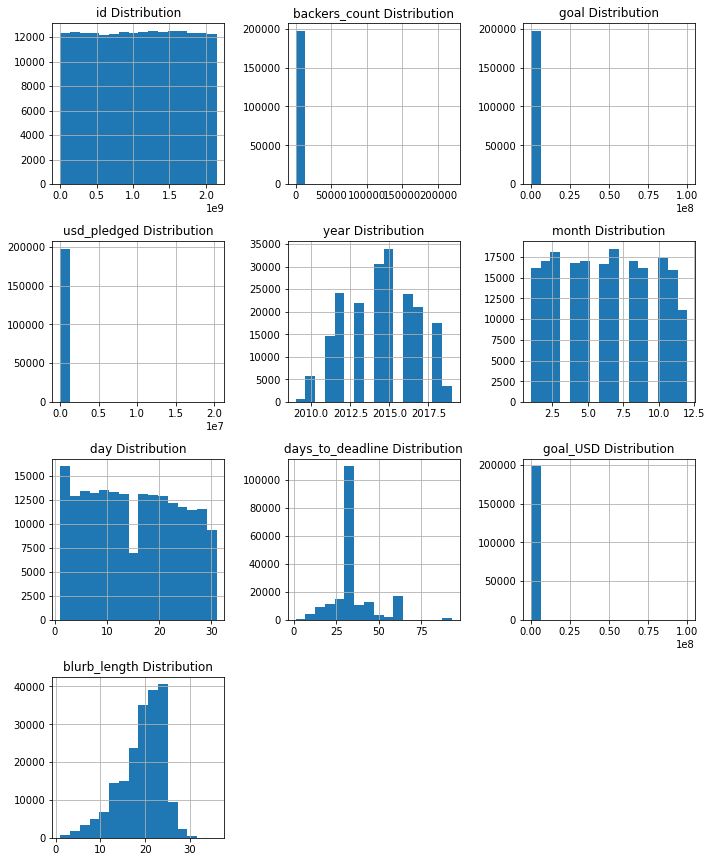

In [18]:
# Univariate visualization without having to manually plot each graph

def draw_histograms(df, columns, n_rows, n_cols):
    fig=plt.figure(figsize =(10, 30))
    for i, var_name in enumerate(columns):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        df[var_name].hist(bins=16,ax=ax)
        ax.set_title(var_name + " Distribution")
        
    fig.tight_layout()  # Improves appearance a bit.
    plt.show()
    
draw_histograms(df_US, num_cols, len(num_cols), 3)

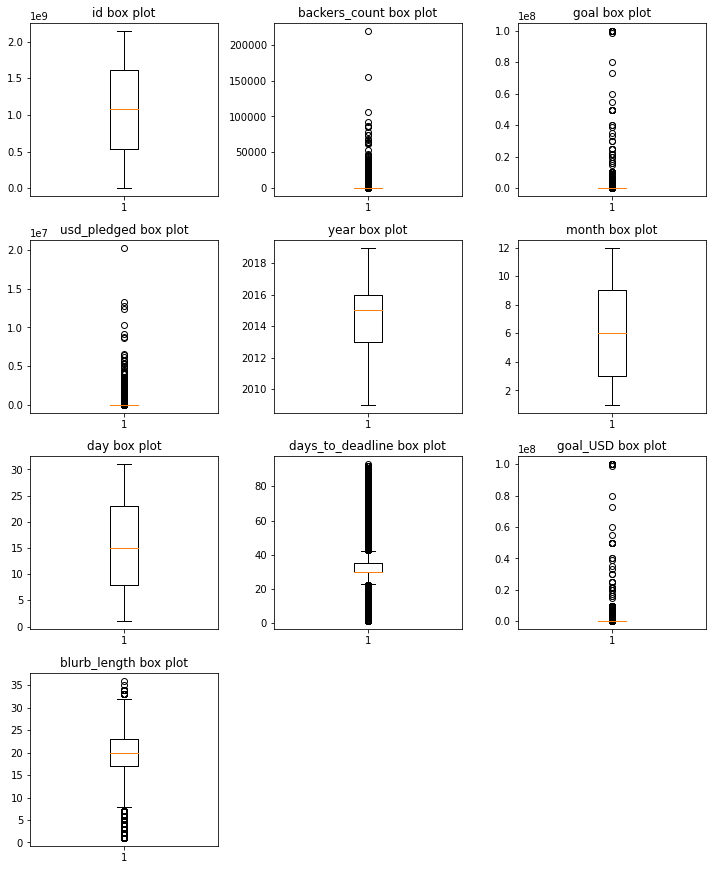

In [19]:
# box plots of to viualize outliers

def draw_box(df, columns, n_rows, n_cols):
    fig=plt.figure(figsize =(10, 30))
    for i, var_name in enumerate(columns):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        ax.boxplot(df[var_name])
        ax.set_title(var_name + ' box plot')
    fig.tight_layout()
    plt.show()
    
draw_box(df_US, num_cols, len(num_cols), 3)

There doesn't really seem to be a huge issue surrounding massive outliers. Some of this data could be fine-tuned using feature engineering to better fit the models, however, it's probably best to keep these features in place. Also, keep in mind that in addition to predicting success vs failure, the user will also be interested in what certain values tied to success. If we alter the data too much, we could run the risk of providing overly normalized data and steer the user in the wrong direction.

# 3. Data Exploration

Now that we have the data filtered the way we want, it's time to dive further into some of the features.

## state - success/failure

In general, pie graphs are not very telling because we lose definition on volume. However, we're only dealing with 2 values, so volume can be inferred in addition to percentages. 

In [20]:
# graphin pie chart of "state"
state = round(df_US["state"].value_counts() / len(df_US["state"]) * 100,2)

labels = list(state.index)
values = list(state.values)

trace1 = go.Pie(labels=labels, values=values, marker=dict(colors=['red']))

layout = go.Layout(title='Distribuition of States', legend=dict(orientation="h"));

fig = go.Figure(data=[trace1], layout=layout)
iplot(fig)

We learned that the rates of success and failure are 53.6% and 46.6%, respectively.

Before we move too far down the way with trying to model our target variable, let's review a couple features against it so we can determine any predictive model we create is valid. Here, we will compare the features "goals_USD" and "usd_pledged" with "state". 

In [21]:
df_failed = df_US[df_US["state"] == "failed"].sample(10000, replace=True)
df_success = df_US[df_US["state"] == "successful"].sample(10000, replace=True)

#First plot
trace0 = go.Histogram(
    x= np.log(df_US.goal_USD + 1),
    histnorm='probability', showlegend=False,
    xbins=dict(
        start=-5.0,
        end=19.0,
        size=1),
    autobiny=True)

#Second plot
trace1 = go.Histogram(
    x = np.log(df_US.usd_pledged + 1),
    histnorm='probability', showlegend=False,
    xbins=dict(
        start=-1.0,
        end=17.0,
        size=1))

# Add histogram data
failed = np.log(df_failed['goal_USD']+1)
success = np.log(df_success["goal_USD"]+1)

trace3 = go.Histogram(
    x=failed,
    opacity=0.60, nbinsx=30, name='Goals Failed', histnorm='probability'
)
trace4 = go.Histogram(
    x=success,
    opacity=0.60, nbinsx=30, name='Goals Sucessful', histnorm='probability'
)


data = [trace0, trace1, trace3, trace4]
layout = go.Layout(barmode='overlay')

#Creating the grid
fig = plotly.tools.make_subplots(rows=2, cols=2, specs=[ [{'colspan': 2}, None], [{}, {}]],
                          subplot_titles=('Failed and Sucessful Projects',
                                          'Goal','Pledged'))

#setting the figs
fig.append_trace(trace0, 2, 1)
fig.append_trace(trace1, 2, 2)
fig.append_trace(trace3, 1, 1)
fig.append_trace(trace4, 1, 1)

fig['layout'].update(title="Distribuitions",
                     height=500, width=900, barmode='overlay')
iplot(fig)

Interesting difference between Pledged and Goal distribuition!

Goal seems a normal distribution, so it would be good if we test the normality of it and also, if exists some statistical difference between failed and success projects.

Let start with the normality test of goal

In [22]:
# goals normality test
stat, p = stats.shapiro(np.log(df_US['goal_USD']+1).sample(500, random_state=42))

print("Shapiro stat:", stat)
print("P-value: ", p)
if p >= .01:
    print('Normal Distribution')
else:
    print("Non-Normal Distribution")

Shapiro stat: 0.9940505027770996
P-value:  0.047672975808382034
Normal Distribution


Based on this information, we are looking at relatively normal data!
Let's go ahead and run a 2-sampled t-test against "goals" and "state". 
Here, we will hypothesize that the there is statistical evidence that the population means of the target variable "state" are significanly different.

This can also prove useful in the modeling phase. If we can't find anything statistically different between success and failure, then how reliable could any predictive modeling tool be for us?

In [135]:
# How large is each group?
treatment_sample = len(df_US[df_US.state == 1])
control_sample = len(df_US[df_US.state == 0])
print('Treatment sample size is ' + str(treatment_sample))
print('Control sample size is ' + str(control_sample))


# What is the avg goal amount for test and control?
treatment_sign_rate = df_US[df_US.state == 1].goal.mean()
control_sign_rate = df_US[df_US.state == 0].goal.mean()
print('Treatment avg goal is ' + str(treatment_sign_rate))
print('Control avg goal rate is ' + str(control_sign_rate))

# Is the experiment already significant?
stats.ttest_ind(df_US[df_US.state == 1].goal, df_US[df_US.state == 0].goal, equal_var = False)


Treatment sample size is 106003
Control sample size is 91874
Treatment avg goal is 9530.42201484864
Control avg goal rate is 60532.810296928394


Ttest_indResult(statistic=-11.887648048504234, pvalue=1.449757207850186e-32)

Cool! The null hypothesis is that the both data are equal, and as it was rejected, so we can be sure that the goal value of successful and failed projects are different.
Based on the distribution of histogram above, the failed project seems to have a higher value.

We also gained confidence that this feature is worth our time and resources to model.

# 4. Feature Engineering

Next, let's look at category breakdown and engineer some features.

__Note:__ In the time-relevant comparisons, we'll leave out 2019 because there are only 2 months of data in that year.

In [24]:
# looking at successful projects and their pledges
only_success_status = df_US[df_US['state'] == 'successful'].copy()
#only_success_status_US = only_success_status[only_success_status['location.country'] == 'US']
most_pledged_cat_US = only_success_status.groupby('category_slug')['usd_pledged'].sum().to_frame().reset_index().sort_values('usd_pledged', ascending = False).head(30).set_index('category_slug')
most_pledged_cat_US.head()

,usd_pledged
category_slug,
games,6.589894e+08
design,5.636045e+08
technology,4.860460e+08
film & video,2.684649e+08
music,1.308196e+08


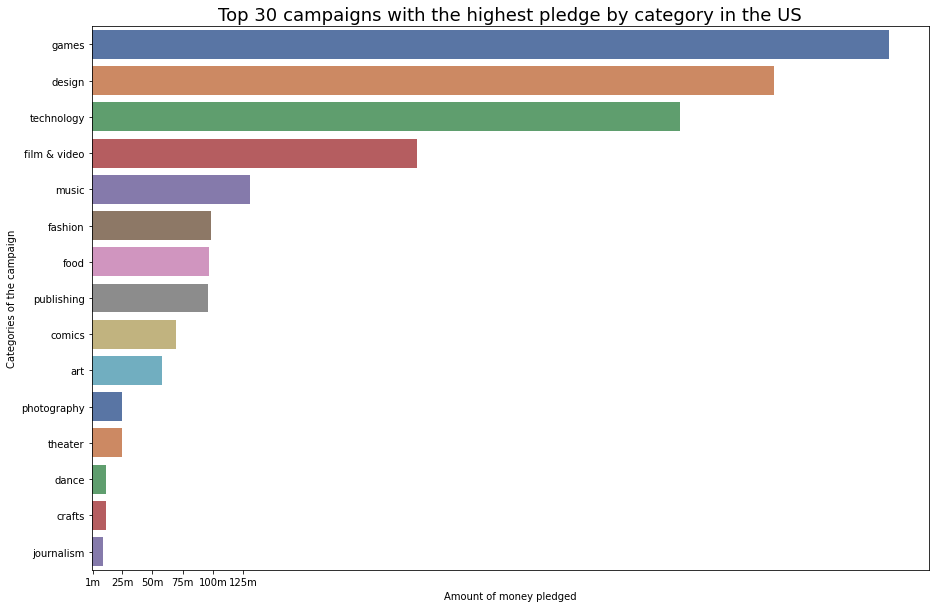

In [25]:
# plotting top pledged categories, broken up by category
plt.figure(figsize=(15,10))
sns.barplot(most_pledged_cat_US['usd_pledged'], most_pledged_cat_US.index, palette='deep')
plt.title("Top 30 campaigns with the highest pledge by category in the US", fontsize=18)
plt.xlabel("Amount of money pledged")
plt.ylabel("Categories of the campaign")
plt.xticks([1000000, 25000000, 50000000, 75000000, 100000000, 125000000],['1m', '25m', '50m', '75m', '100m', '125m'])
plt.show()

This plot tells us that the top 4-5 categories with the most pledges surround the digital, gaming, and tech industries. The categories with the lowest pledge amounts are based around the arts and crafts. 

This isn't super revealing as this chart basically reflects general perception bias of these industries.

In [26]:
# looking at success/failure in each category
kick_data_US =  df_US[(df_US['year'] != 2019)].copy()
kick_data_US = kick_data_US.groupby(['category_slug', 'state'])['name'].count().reset_index(name='count')
kick_data_US = kick_data_US.sort_values('count', ascending = False).set_index('category_slug')
kick_data_US.head()

,state,count
category_slug,,
music,successful,17958
film & video,successful,17571
publishing,failed,14570
music,failed,13122
film & video,failed,11696


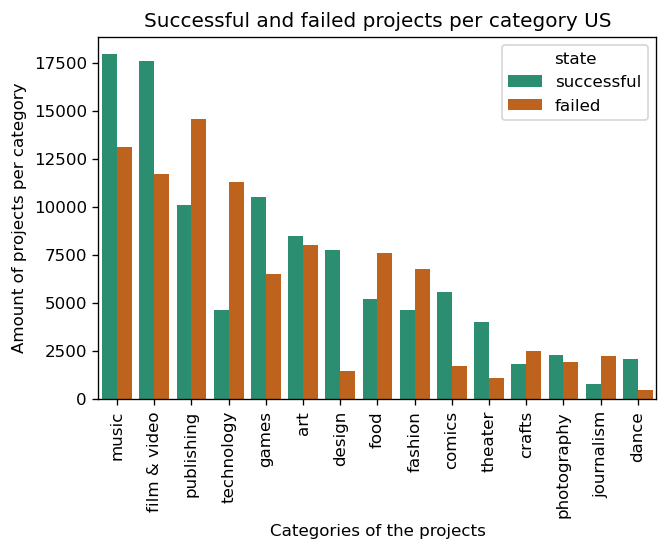

In [27]:
plt.figure(dpi=120)
sns.barplot(kick_data_US.index, kick_data_US['count'],
            hue= kick_data_US['state'], palette = "Dark2")
plt.xticks(rotation = 90)
plt.title("Successful and failed projects per category US", fontsize=12)
plt.xlabel("Categories of the projects")
plt.ylabel("Amount of projects per category")
plt.show()

reference: 1 = success, 0 = failed

This plot gives us some good insight into category performance. You'll remember that the technology category in the previous graph was one of the highest pledged categories. However, we can see that it has one of the lowest success rates. Alternatively, the comics and design have 2 of the highest success rates. 

Volume isn't everything and this is how users can begin deducing their chances of success. 

In [28]:
#Goal and amount pledged per category (for non-US)
kick_data_goal_pledge = df_US[(df_US['year'] != 2019) & (df_US.state == 'successful')]

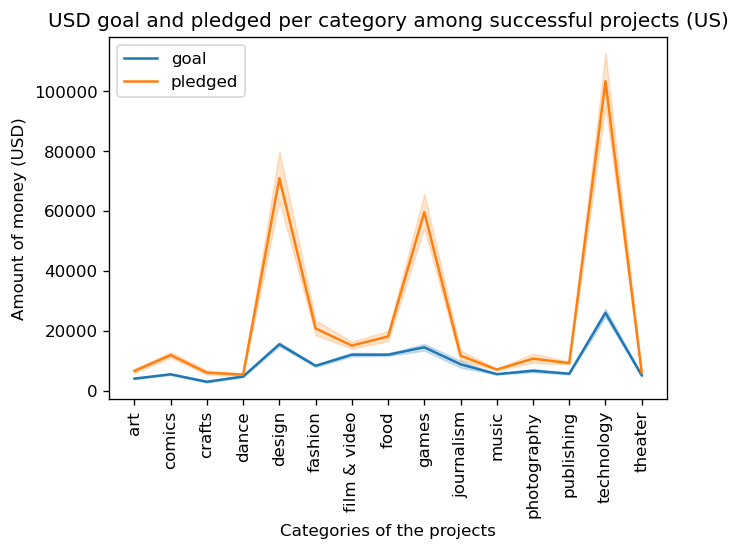

In [29]:
plt.figure(dpi=120)
sns.lineplot(data=kick_data_goal_pledge, x= kick_data_goal_pledge.category_slug, y=kick_data_goal_pledge.goal_USD)
sns.lineplot(data=kick_data_goal_pledge, x= kick_data_goal_pledge.category_slug, y=kick_data_goal_pledge.usd_pledged)
plt.title("USD goal and pledged per category among successful projects (US)", fontsize=12)
plt.xlabel("Categories of the projects")
plt.ylabel("Amount of money (USD)")
plt.xticks(rotation = 90)
plt.legend(['goal', 'pledged'], loc='upper left')
plt.show()

Ah! Now, this graph shows pledges vs goals for all successful projects. The interesting thing here is that design, games, and technology are the main categories that not only meet their goals, they seem to leave their goals behind in the dust! Now, we still need to be realistic about this observation. 

What do we know so far about technology? It is one of the highest pledged categories, lowest success rates, and highest delta between goals and pledges. This can be interpreted many ways but I see this as technology is very competitive but has the best capability for gaining strong traction and popularity for the handful of successful projects. We know nothing about the owners of these projects either. It's easy to speculate but we need to keep our heads on straight and understand what each piece of information provides.

In [31]:
#success rate vs duration
kick_data_US = df_US[(df_US['year'] != 2019) & (df_US['days_to_deadline'] <= 61)]
project_duration = kick_data_US.groupby(['days_to_deadline','state'])['days_to_deadline'].count().reset_index(name='count')
project_duration["sum_counts"] = project_duration.groupby('days_to_deadline')['count'].transform('sum')
project_duration["pct"] = project_duration['count']/project_duration["sum_counts"]
project_duration = project_duration[project_duration['state'] == 'successful']
project_duration.head()

,days_to_deadline,state,count,sum_counts,pct
1,1,successful,24,51,0.470588
3,2,successful,44,83,0.530120
5,3,successful,61,119,0.512605
7,4,successful,62,114,0.543860
9,5,successful,159,269,0.591078


<Figure size 720x480 with 0 Axes>

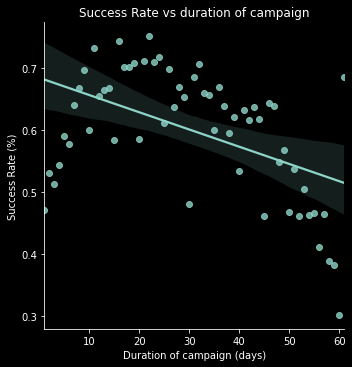

In [32]:
plt.figure(dpi=120)
plt.style.use('dark_background')
sns.lmplot(data=project_duration, x="days_to_deadline", y="pct")
plt.title("Success Rate vs duration of campaign", fontsize=12)
plt.xlabel("Duration of campaign (days)")
plt.ylabel("Success Rate (%)")
plt.show()

Success vs time is an interesting trend. It's almost a shame that this line of fit is linear because the trend of data points almost seem parabolic or quadratic. What do we see?

The duration of each project seems to be positively correlated with success rate on the left of the graph but the shifts to become negatively correlated. What does this mean?

Again, it's hard to know and easy to speculate. My interpretation of this plot suggests that the duration could have been extended due to limited interest in given projects. They might not have listed the projects for 2 months from the start but rather, extended the deadline to gain more exposure. 

No matter how this is sliced, we can agree that there are 2 different trends. It's up to business units to determine what drivers influence these trends, and if they are important enough to shape their strategy.

In [33]:
# transforming pledged and goal
df_US['pledged_log'] = np.log(df_US['usd_pledged'] + 1)
df_US['goal_log'] = np.log(df_US['goal_USD'] + 1)

# creating differential features between goal and pledged
df_US['diff_pledged_goal'] = round((df_US['usd_pledged'] /df_US['goal_USD']) * 100, 2)
df_US['diff_pledged_goal'] = df_US['diff_pledged_goal'].astype(float)

In [34]:
#creating goal features to check what range goal lies in
df_US['Goal_10'] = df_US.goal.apply(lambda x: x // 10)
df_US['Goal_1000'] = df_US.goal.apply(lambda x: x // 1000)
df_US['Goal_100'] = df_US.goal.apply(lambda x: x // 100)
df_US['Goal_500'] = df_US.goal.apply(lambda x: x // 500)

In [35]:
print("Min Goal and Pledged values")
print(df_US[["goal_USD", "usd_pledged"]].min())
print("")
print("Mean Goal and Pledged values")
print(round(df_US[["goal_USD", "usd_pledged"]].mean(),2))
print("")
print("Median Goal and Pledged values")
print(df_US[["goal_USD", "usd_pledged"]].median())
print("")
print("Max Goal and Pledged values")
print("goal       100000000.0") #If i put the both together give me back log values, 
print("pledged     20338986.27") # so i decide to just show this values
print("dtype: float64")
print("")
print("Std Goal and Pledged values")
print(round(df_US[["goal_USD", "usd_pledged"]].std(),2))

Min Goal and Pledged values
goal_USD       0.01
usd_pledged    0.00
dtype: float64

Mean Goal and Pledged values
goal_USD       33210.76
usd_pledged    13710.95
dtype: float64

Median Goal and Pledged values
goal_USD       5000.0
usd_pledged    1490.0
dtype: float64

Max Goal and Pledged values
goal       100000000.0
pledged     20338986.27
dtype: float64

Std Goal and Pledged values
goal_USD       886535.75
usd_pledged    121369.81
dtype: float64


In [36]:
# Add pledged_ratio column
df_US['pledged_ratio'] = df_US['usd_pledged']/ df_US['goal_USD']

In [37]:
success_timely = []

for year in range(2009, 2019):
    success = len (df_US[(df_US['year'] == year) & (df_US['state'] == 'successful')]['state'])
    overall = len (df_US[df_US['year'] == year]['year'])
    ratio = success/ overall
    success_timely.append(ratio)
    print ("Year = ",year, ratio * 100, '%')

Year =  2009 65.48956661316213 %
Year =  2010 68.87674131546464 %
Year =  2011 67.78368069745267 %
Year =  2012 59.66729959547593 %
Year =  2013 63.60706341640565 %
Year =  2014 44.970973843845805 %
Year =  2015 38.45497853320003 %
Year =  2016 44.97341205041243 %
Year =  2017 55.835436407790105 %
Year =  2018 64.32961529706351 %


The interesting thing here is that success seem to trend down from 2013 - 2015. What could have caused this?

In [38]:
def percentage_less_than(data, col, nums):
    for num in nums:
        perc = (data["goal"] < num).sum()/len(data)
        print(f"{np.round(perc*100, 2)}% of the {col} column is less than {num}")
    print("")
    print(f"Maximum of {col} column is {max(data[col])}")
    print(f"Minimum of {col} column is {min(data[col])}")

percentage_less_than(df_US, "goal", [10000, 25000, 50000, 75000, 100000])

65.56% of the goal column is less than 10000
84.9% of the goal column is less than 25000
92.45% of the goal column is less than 50000
95.77% of the goal column is less than 75000
96.81% of the goal column is less than 100000

Maximum of goal column is 100000000.0
Minimum of goal column is 0.01


In [39]:
# change the format of the date columns to pd.DateTime
df_US["launched"] = pd.to_datetime(df_US["launched_at"].str[0:10], format='%Y-%m-%d')
df_US["deadline"] = pd.to_datetime(df_US["deadline"], format='%Y-%m-%d')

In [40]:
# Turn the "state" variable into numeric (0 for failed, 1 for successful)
df_US["state"] = df_US["state"].replace({"failed": 0,
                                            "successful": 1})

In [41]:
# calculate percentage of goal raised (capped at 100% of goal since that is the definition of successful)
df_US["percentage_raised"] = np.round((df_US["usd_pledged"]/df_US["goal_USD"]) * 100, 2)
df_US.loc[df_US["percentage_raised"] > 100, "percentage_raised"] = 100.00

# Colinearity

In [42]:
# create new numeric column list, excluding "id" after creating all those features
num_cols = [col for col in df_US.select_dtypes(include=np.number).columns.copy()
            if col not in ['id']]

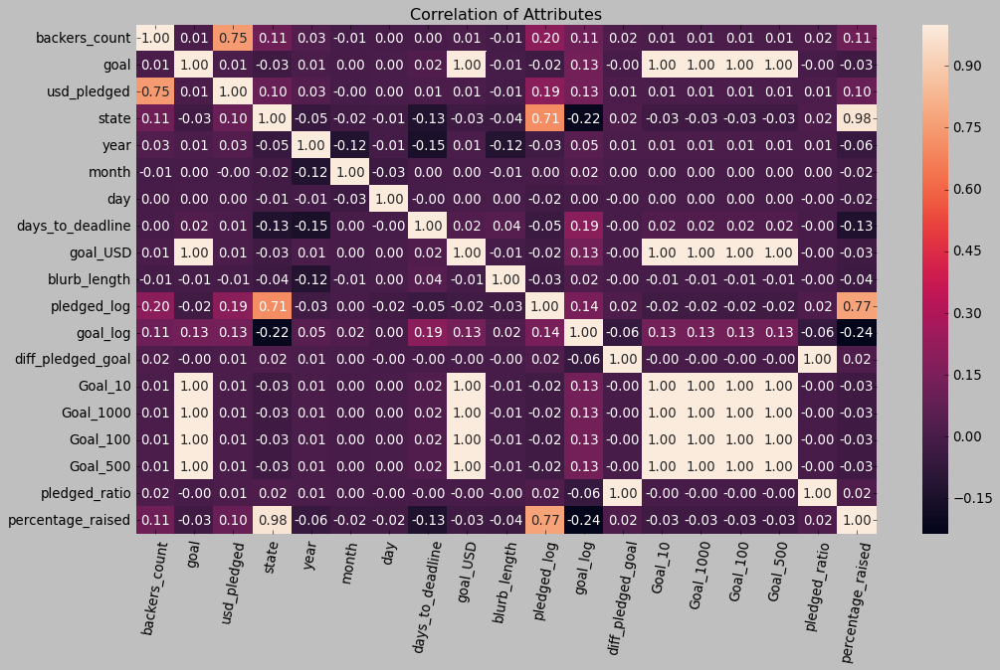

In [43]:
# See the correlation heatmap of the features

correlation = df_US[num_cols].corr()

plt.style.use('classic')
plt.figure(figsize=(15,8))
plt.title('Correlation of Attributes')
a = sns.heatmap(correlation, annot=True, fmt='.2f', linecolor='white')
a.set_xticklabels(a.get_xticklabels(), rotation=80)

plt.show()

Wow!! Not only do we have some strong collinear relationships, many are from features we JUST made. This is a good sanity check for feature selection. We could get so crazy with new features but the unfortunate truth is that many are so derivative from their origin that they don't help us out statistically. We need to remedy this situation.

The next cell below will run a script that removes features with a correlation coeficient greater than 0.70.

In [44]:
# Create correlation matrix

corr_matrix = df_US[num_cols].corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.87
to_drop = [column for column in upper.columns if any(upper[column] > 0.70)]

# Drop features 
df_US.drop(to_drop, axis=1, inplace=True)

In [45]:
# double check df_US to make sure the target variable "state" was not deleted
# commented out for cleaner presentation
#df_US.head()

Still not done. There are some features that really can't be modeled for new projects. Some of these features are only known after the project goes live and/or reaches the deadline.

In [46]:
# drop columns that are not looking forward-based. 
#User won't know these features before uploading their projects. 
drop_list = ['backers_count', 'diff_pledged_goal', 'deadline', 'launched_at']

df_US = df_US.drop(drop_list, axis=1).copy()

In [47]:
df_US.head()

,id,blurb,goal,name,slug,state,year,month,day,days_to_deadline,category_name,category_slug,blurb_length,location_state,goal_log,launched
0,857125548,Exploring paint and its place in a digital world.,2000.0,Remix,remix,0,2015,3,19,42,Digital Art,art,9,NY,7.601402,2015-03-19
1,1038659700,Mike Fassio wants a side-by-side photo of me a...,10.0,Photo of Grant and Hazel eating cake with bare...,photo-of-grant-and-hazel-eating-cake-with-bare...,0,2014,7,17,10,Digital Art,art,21,WA,2.397895,2014-07-17
2,1238331911,I need your help to get a nice graphics tablet...,900.0,Minecraft Digital Art/Animations,minecraft-digital-art-animations,0,2014,7,30,30,Digital Art,art,12,VA,6.803505,2014-07-30
3,189217262,I want to create a Nature Photograph Series of...,900.0,Sacramento Nature Photograph Series,nature-photograph-project,0,2015,5,11,20,Digital Art,art,17,CA,6.803505,2015-05-11
6,1653837117,Help me raise money to get a drawing tablet,2900.0,I love Drawing,i-love-drawing,0,2015,4,6,40,Digital Art,art,9,CA,7.972811,2015-04-06


# Classification Modeling

There are 2 approaches we will try. <br>
1) numeric data modeling
    - KNN, RandomForest, Gradient Boosting

2) NLP tfidf modeling
    - LogisticRegression, SGDClassifier, MultinomialNB, LinearSVC
   
We will begin with the numeric data. The first step will be transforming the category columns with get_dummies.

In [48]:
# transforming category_name and category_slug into dummy columns
df_dummies= pd.get_dummies(data = df_US, columns = ['category_name', 'category_slug']).copy()

In [49]:
df_dummies.head()

,id,blurb,goal,name,slug,state,year,month,day,days_to_deadline,blurb_length,location_state,goal_log,launched,category_name_3D Printing,category_name_Academic,category_name_Accessories,category_name_Action,category_name_Animals,category_name_Animation,category_name_Anthologies,category_name_Apparel,category_name_Apps,category_name_Architecture,category_name_Art,category_name_Art Books,category_name_Audio,category_name_Bacon,category_name_Blues,category_name_Calendars,category_name_Camera Equipment,category_name_Candles,category_name_Ceramics,category_name_Children's Books,category_name_Childrenswear,category_name_Chiptune,category_name_Civic Design,category_name_Classical Music,category_name_Comedy,category_name_Comic Books,category_name_Comics,category_name_Community Gardens,category_name_Conceptual Art,category_name_Cookbooks,category_name_Country & Folk,category_name_Couture,category_name_Crafts,category_name_Crochet,category_name_DIY,category_name_DIY Electronics,category_name_Dance,category_name_Design,category_name_Digital Art,category_name_Documentary,category_name_Drama,category_name_Drinks,category_name_Electronic Music,category_name_Embroidery,category_name_Events,category_name_Experimental,category_name_Fabrication Tools,category_name_Faith,category_name_Family,category_name_Fantasy,category_name_Farmer's Markets,category_name_Farms,category_name_Fashion,category_name_Festivals,category_name_Fiction,category_name_Film & Video,category_name_Fine Art,category_name_Flight,category_name_Food,category_name_Food Trucks,category_name_Footwear,category_name_Gadgets,category_name_Games,category_name_Gaming Hardware,category_name_Glass,category_name_Graphic Design,category_name_Graphic Novels,category_name_Hardware,category_name_Hip-Hop,category_name_Horror,category_name_Illustration,category_name_Immersive,category_name_Indie Rock,category_name_Installations,category_name_Interactive Design,category_name_Jazz,category_name_Jewelry,category_name_Journalism,category_name_Kids,category_name_Knitting,category_name_Latin,category_name_Letterpress,category_name_Literary Journals,category_name_Literary Spaces,category_name_Live Games,category_name_Makerspaces,category_name_Metal,category_name_Mixed Media,category_name_Mobile Games,category_name_Movie Theaters,category_name_Music,category_name_Music Videos,category_name_Musical,category_name_Narrative Film,category_name_Nature,category_name_Nonfiction,category_name_Painting,category_name_People,category_name_Performance Art,category_name_Performances,category_name_Periodicals,category_name_Pet Fashion,category_name_Photo,category_name_Photobooks,category_name_Photography,category_name_Places,category_name_Playing Cards,category_name_Plays,category_name_Poetry,category_name_Pop,category_name_Pottery,category_name_Print,category_name_Printing,category_name_Product Design,category_name_Public Art,category_name_Publishing,category_name_Punk,category_name_Puzzles,category_name_Quilts,category_name_R&B,category_name_Radio & Podcasts,category_name_Ready-to-wear,category_name_Residencies,category_name_Restaurants,category_name_Robots,category_name_Rock,category_name_Romance,category_name_Science Fiction,category_name_Sculpture,category_name_Shorts,category_name_Small Batch,category_name_Software,category_name_Sound,category_name_Space Exploration,category_name_Spaces,category_name_Stationery,category_name_Tabletop Games,category_name_Taxidermy,category_name_Technology,category_name_Television,category_name_Textiles,category_name_Theater,category_name_Thrillers,category_name_Translations,category_name_Typography,category_name_Vegan,category_name_Video,category_name_Video Art,category_name_Video Games,category_name_Wearables,category_name_Weaving,category_name_Web,category_name_Webcomics,category_name_Webseries,category_name_Woodworking,category_name_Workshops,category_name_World Music,category_name_Young Adult,category_name_Zines,category_slug_art,category_slug_comics,category_slug_crafts,cat

In [50]:
df_dummies.shape

(197877, 188)

# Model Prep

In [51]:
# create new numeric data column list
# leaving out "id" and "state"
num_cols = [col for col in df_dummies.select_dtypes(include=np.number).columns.copy()
            if col not in ['id', 'state']]

In [54]:
# setting our X, y
X = df_dummies[num_cols]
y = df_dummies['state']

# scaling our data
scaler = StandardScaler()
#scaler.fit(x)                
#x_train = scaler.transform(x)
Xstd = scaler.fit_transform(X)

In [55]:
# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(Xstd, y, test_size = 0.2, random_state = 42)

Modeling caveats:

- parameter tuning was driven by both attempting accuracy and balancing computation power. Personal laptops aren't typically very powerful enough to do heavy lifting.

- due to said computation issues, KNN methodology of finding the best n_neighbors value was not possible

# KNN

In [56]:
#Setup a knn classifier with k neighbors
# I chose 9 because it takes way too long to run the script to select the best n_neighbors
knn = KNeighborsClassifier(n_neighbors=9)

#Fit the model
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=9)

In [57]:
# Predict classes given the validation features
knn_pred_y = knn.predict(X_test)

#df_dummies['KNN_pred'] = pred_y
# Calculate the accuracy performance metric
accuracy = metrics.accuracy_score(y_test, knn_pred_y)
print("Accuracy: ", accuracy)

# Calculate the precision performance metric
precision = precision_score(y_test,knn_pred_y)
print("Precision: ", precision)

# Calculate the recall performance metric
recall = recall_score(y_test,knn_pred_y)
print("Recall Score: ", recall)


Accuracy:  0.7453759854457247
Precision:  0.7829007170992829
Recall Score:  0.7284902025280767


In [58]:
# confusion matrix
confusion_matrix(y_test,knn_pred_y)

array([[13996,  4299],
       [ 5778, 15503]], dtype=int64)

In [59]:
# I would try a cv=10
# but chose 5 initially due to computation time
cross_val_score(knn, X, y, cv=5)

array([0.58234789, 0.59374368, 0.59032217, 0.6097789 , 0.59279848])

KNN doesn't seem to provide exciting performance metrics. In addition, KNN took its sweet time to iterate through the data. On a positive note, the cross validation score is fairly consistent. As mentioned before, we chose 5 due to processing capabilities of the computer. Otherwise, cv=10 would be recommended. 

In addition to other recommendations for best practice, we would suggest the following script be run to find the optimum n_neighbors value when the resources/time are available. 

#Setup arrays to store training and test accuracies <br>
neighbors = np.arange(low,high) <br>
train_accuracy =np.empty(len(neighbors)) <br>
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
    knn.fit(X_train, y_train)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train, y_train)
    
    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test, y_test) 

## Random Forest

In [62]:
# Create the classifier and fit it to our training data
model = RandomForestClassifier(random_state=123,
                               n_estimators=20)
model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=20, random_state=123)

In [63]:
# Predict classes given the validation features
rfc_pred_y = model.predict(X_test)
#df_dummies['RFC_pred'] = pred_y

# Calculate the accuracy as our performance metric
rfc_accuracy = metrics.accuracy_score(y_test, rfc_pred_y)
print("Accuracy: ", rfc_accuracy)

# Calculate the precision performance metric
rfc_precision = precision_score(y_test, rfc_pred_y)
print("Precision: ", rfc_precision)

# Calculate the recall performance metric
rfc_recall = recall_score(y_test, rfc_pred_y)
print("Recall Score: ", rfc_recall)

Accuracy:  0.7554073175662017
Precision:  0.8040572417046705
Recall Score:  0.7207837977538649


In [64]:
# I would try a cv=10
# but chose 5 initially due to computation time
cross_val_score(model, X, y, cv=5)

array([0.70954619, 0.56463513, 0.63527479, 0.68212255, 0.70360076])

In [66]:
# confusion matrix
confusion_matrix(y_test, rfc_pred_y)

array([[14557,  3738],
       [ 5942, 15339]], dtype=int64)

Let's compare the performance metrics (accuracy, precision, recall, and confusion matrix). Not only is this random forest model faster than KNN, the performance appears to have a slight advantage. However, the cross validation score shows us something a bit alarming/annoying. We see that the scores are noticeably different. There is a risk of over fitting in this solution somewhere. This issue highlights the importance to run different models because the downsides of certain models might even point the scientist to revisit their data to clean it up further.

Also, when n_estimaters parameter was set to 100-200, the cv scores and performance metrics were worse than with the value of 20.

We don't really know what this issue is right now, so let's move on to the gradient boosting model.

# Gradient Boosting

In [67]:
# gradient boosting
clf_gb = GradientBoostingClassifier(n_estimators=100, 
                                 max_depth=2,
                                 learning_rate=.3,
                                 random_state=42)
clf_gb.fit(X_train, y_train)
#gb_accuracy = round(clf_gb.score(X_test, y_test) * 100, 2)
#print("Accuracy: ", gb_accuracy)

# Predict classes given the validation features
gb_pred_y = clf_gb.predict(X_test)

# Calculate the accuracy performance metric
gb_accuracy = metrics.accuracy_score(y_test, gb_pred_y)
print("Accuracy: ", gb_accuracy)

# Calculate the precision performance metric
gb_precision = precision_score(y_test, gb_pred_y)
print("Precision: ", gb_precision)

# Calculate the recall performance metric
gb_recall = recall_score(y_test, gb_pred_y)
print("Recall Score: ", gb_recall)

Accuracy:  0.761294724075197
Precision:  0.8064532836130102
Recall Score:  0.7316855410929938


In [68]:
# confusion matrix
confusion_matrix(y_test, gb_pred_y)

array([[14558,  3737],
       [ 5710, 15571]], dtype=int64)

In [69]:
# I would try a cv=10
# but chose 5 initially due to computation time
cross_val_score(clf_gb, X, y, cv=5)

array([0.72447948, 0.60660501, 0.63772584, 0.73377132, 0.74756791])

Gradient boosting shares a similar story with random forest. Decent predictive abilities compared to KNN but we have evidence of overfitting. 

This would be a good time to review our data and tuning parameters. Based on how many neighbors, estimators, or even learning rate could impact our output. Again, we are limited on computation power and this template is giving us a lot of great direction for what we want to do for our v2 model. 

A great option we have with gradient boosting is reviewing our features of importance. Let's check those out real quick.

### Features of Importance

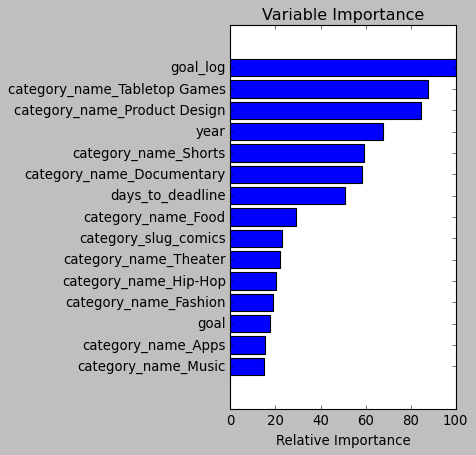

In [70]:
feature_importance = clf_gb.feature_importances_

# customized number 
num_features = 15

# only plot the customized number of features
# Make importances relative to max importance.
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.subplot(1, 2, 2)
plt.barh(range(num_features), feature_importance[sorted_idx[-num_features:]], color='b', align='center')
#plt.yticks(range(num_features), [feature_importance[i] for i in sorted_idx[-num_features:]])
plt.yticks(range(num_features), [X.columns[i] for i in sorted_idx[-num_features:]])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

BOOM! There's some low hanging fruit we can point to right away. Goal and the log transformation of goal are both in this data set. During our feature selection process, we reduced collinearity for highly correlated features. This tells me that these 2 aren't necessarily directly correlated but there could be a multicollinear component that we missed. In the v2 iteration of this workflow, we should really include reducing multicollinearity by implementing a variance inflation factor(VIF) function. This should highlight any other strong multicollinear relationships that would otherwise go overlooked.

After implementing the VIF function, then revisting the models will help us determine if further parameter tuning will help reduce apparent overfitting.

All of this said, my favorite model at this point is gradient boosting. It seems to be relatively fast, accurate, and doesn't appear to have to same level of influence to overfitting as random forest.

Let's move on to our text data and see what shakes loose.

# NLP

In this model, we will focus our efforts on the "blurb" (description) column. This column (ideally) provides important context for each project. Since we already know the categorical assignments, we only want to review if the topics can predict success or failure. This could hypothetically guide users towards successful ways to market their projects on Kickstarter. Of course, NLP value can still be in the eye of the beholder. Meaning, some customers might want to know this information and others might not.

In [71]:
# the value comes from the customer. 
# how does feedback drive value without numbers?
wn = nltk.WordNetLemmatizer()
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [72]:
# changing viewing size for personal preference
pd.set_option('display.max_colwidth', 100)

Before prepping any model, we need to clean up the data. The following function does quite a bit in just a few lines of code. The function "clean_text" removes punctuations and stopwords, tokenizes, lemmatizes, rejoins, and transforms all text to lower case. The output is saved as a new column named "blurb_clean" at the tail end of the data frame.

In [73]:
# cleans original text and saves output in new column
# lower-case, removes punctuation, creates tokens, lemmatizes, removes stopwords, rejoins words in usable format
def clean_text(text):
    text = "".join([word.lower() for word in text if word not in string.punctuation])
    tokens = re.split('\W+', text)
    text = [wn.lemmatize(word) for word in tokens if word not in stopwords]
    return ' '.join(text)

df_US['blurb_clean'] = df_US['blurb'].apply(lambda x: clean_text(x.lower()))

df_US.head()

,id,blurb,goal,name,slug,state,year,month,day,days_to_deadline,category_name,category_slug,blurb_length,location_state,goal_log,launched,blurb_clean
0,857125548,Exploring paint and its place in a digital world.,2000.0,Remix,remix,0,2015,3,19,42,Digital Art,art,9,NY,7.601402,2015-03-19,exploring paint place digital world
1,1038659700,Mike Fassio wants a side-by-side photo of me and Hazel eating cake with our bare hands. Let's m...,10.0,Photo of Grant and Hazel eating cake with bare hands,photo-of-grant-and-hazel-eating-cake-with-bare-han,0,2014,7,17,10,Digital Art,art,21,WA,2.397895,2014-07-17,mike fassio want sidebyside photo hazel eating cake bare hand let make reality
2,1238331911,I need your help to get a nice graphics tablet and Photoshop!,900.0,Minecraft Digital Art/Animations,minecraft-digital-art-animations,0,2014,7,30,30,Digital Art,art,12,VA,6.803505,2014-07-30,need help get nice graphic tablet photoshop
3,189217262,I want to create a Nature Photograph Series of photos of wildlife in Sacramento and surrounding ...,900.0,Sacramento Nature Photograph Series,nature-photograph-project,0,2015,5,11,20,Digital Art,art,17,CA,6.803505,2015-05-11,want create nature photograph series photo wildlife sacramento surrounding area
6,1653837117,Help me raise money to get a drawing tablet,2900.0,I love Drawing,i-love-drawing,0,2015,4,6,40,Digital Art,art,9,CA,7.972811,2015-04-06,help raise money get drawing tablet


In [74]:
# create new dataframe that is specifically the text and outcome data
df_US_nlp = df_US[['id', 'blurb_clean', 'state']].copy()

In [75]:
# split and train data based on vectorized output
x_train, x_test, y_train, y_test = train_test_split(df_US_nlp['blurb_clean'], df_US_nlp['state'], train_size=0.8)
vectorizer = TfidfVectorizer().fit(x_train)
x_train_v = vectorizer.transform(x_train)
x_test_v  = vectorizer.transform(x_test)

In [76]:
# function that applies 4 models
entries = []
def train():
    models = {
        "LogisticRegression": LogisticRegression(),
        "SGDClassifier": SGDClassifier(),
        "Multinomial":MultinomialNB(),
        "LinearSVC": LinearSVC(),
    }
    
    # for loop that predicts, evaluates, and times each model
    for model in models:
        print("training model"+model)
        start = time()
        models[model].fit(x_train_v, y_train)
        end = time()
        print("trained in {} secs".format(end-start))
        y_pred = models[model].predict(x_test_v)
        entries.append((model,accuracy_score(y_test, y_pred)))
        
# given more time, we would also run CV methods, recall, and precision scores.

In [77]:
# call the function above
train()

training modelLogisticRegression
trained in 3.631289482116699 secs
training modelSGDClassifier
trained in 0.43184566497802734 secs
training modelMultinomial
trained in 0.03789567947387695 secs
training modelLinearSVC
trained in 2.7014968395233154 secs


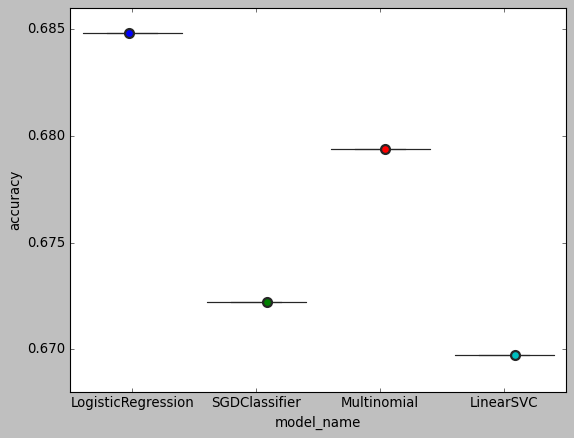

In [78]:
# graph of each model and how they compare based on accuracy
cv_df = pd.DataFrame(entries, columns=['model_name','accuracy'])
import seaborn as sns
sns.boxplot(x='model_name', y='accuracy', data=cv_df)
sns.stripplot(x='model_name', y='accuracy', data=cv_df, 
              size=8, jitter=True, edgecolor="gray", linewidth=2)
plt.show()

Logistic regression has the highest accuracy score near 0.685! The downside is it's considerably slower than the other models with a runtime of 3.63 seconds. 

Take a minute and consider the range of accuracy scores in this plot. The range of scores is only 0.015. If we were to zoom out to a broader scale, these accuracy scores would almost look like they were overalapping with eachother. 
The question then becomes, should we consider a slightly less accurate model in order to save a significant amount of time? The Multinomial model is the second most accurate model and seems to be the fastest. I would select the Multinomial model for NLP at this point.

Here are a few caveats to this output, which might be considered weaknesses to the models.
- We did not perform overfitting analysis with the key words.
- No hyperparameter tuning was performed
- Feature engineering was light, as this was a first pass attempt.

# Value Concepts for Users
Let's introduce some value concepts that users may take away from this workflow. 
The customer can explore the aggregated data below and view the general range of values tied to success. 

When this project becomes productized, the ultimate goal would be to allow the customer to add their project information and we would be able to estimate similar features based on model predictions (i.e. success rates, suggested goals and timelines, etc). These outputs would be based on the classification model parameters we select to use and optimize.

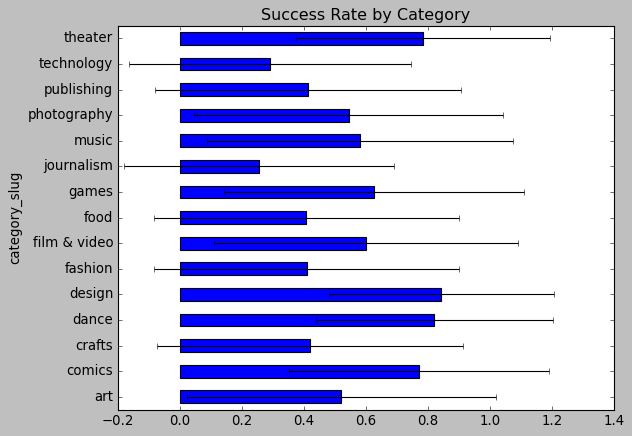

In [114]:
# understanding success rates by broad category

# create new dataframe grouped by 'category_slug'
# aggregate 'state' values so we can calculate success rates
success_rate_df = df_US.groupby('category_slug')['state'].agg([np.mean, np.std, 'count', np.sum])

# calculate success rate
success_rate_df['success_rate'] = success_rate_df['sum']/success_rate_df['count']
#print(success_rate_df.sort_values(by=['success_rate'], ascending=False))

# plot success rates and error bars
success_rate_df.plot(kind= 'barh', y='mean', legend=False,
                 xerr='std', title='Success Rate by Category')

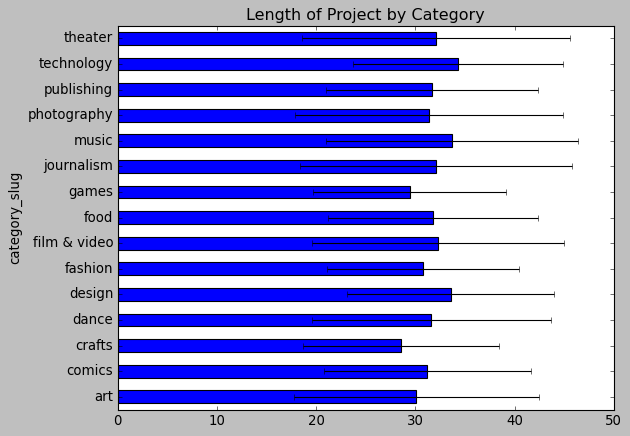

In [120]:
# create df with only successful projects
successful_df = df_US.loc[df_US['state']==1].copy()

# groupby category and agg days_to_deadline
project_timeline_df = successful_df.groupby('category_slug')['days_to_deadline'].agg([np.mean, np.std])

# plot project lengths with error bars
project_timeline_df.plot(kind= 'barh', y='mean', legend=False,
                 xerr='std', title='Length of Project by Category')

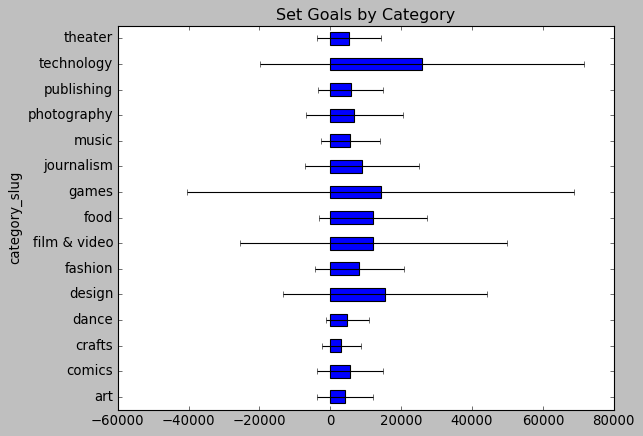

In [104]:
# using the successful df defined earlier, create new df grouped by category 
# agg goals
project_goals_df = successful_df.groupby('category_slug')['goal'].agg([np.mean, np.std])

# plot goals with error bars
project_goals_df.plot(kind= 'barh', y='mean', legend=False,
                 xerr='std', title='Set Goals by Category')

These visualizations might need some work because obviously, it's not likely anyone set negative goal. 
We can still see the average values with an error bar that represents the ranges. 

For example, let's focus on the technology category. We can see the average success rate is around 30%, staged for 30 days, and our goal might be want to be around 25,000 USD. Technology has 16 sub-categories, so let's dig in further. It seems the length of each project is roughly 30 days, so no need to really plot that at this point.

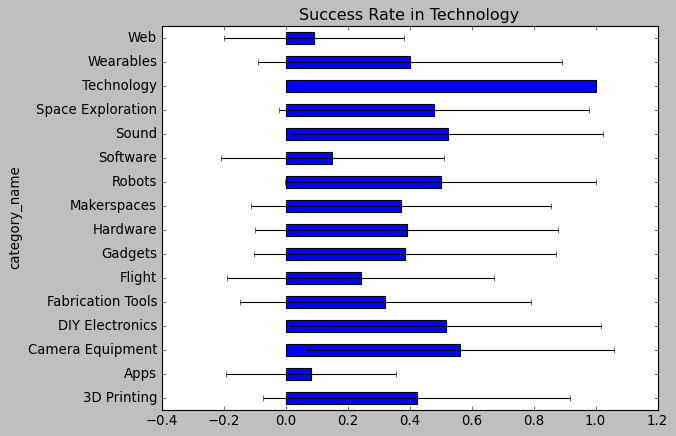

In [132]:
# Splitting out the Technology category

# create df with only technology projects
tech_df = df_US.loc[df_US['category_slug']=='technology'].copy()

# new df grouped by category_name and agg state
tech_suc_rate_df = tech_df.groupby('category_name')['state'].agg([np.mean, np.std, 'count', np.sum])

# calculate success rate
tech_suc_rate_df['success_rate'] = tech_suc_rate_df['sum']/tech_suc_rate_df['count']
#print(success_rate_df.sort_values(by=['success_rate'], ascending=False))

# plot success rates and error bars
tech_suc_rate_df.plot(kind= 'barh', y='mean', legend=False,
                 xerr='std', title='Success Rate in Technology')

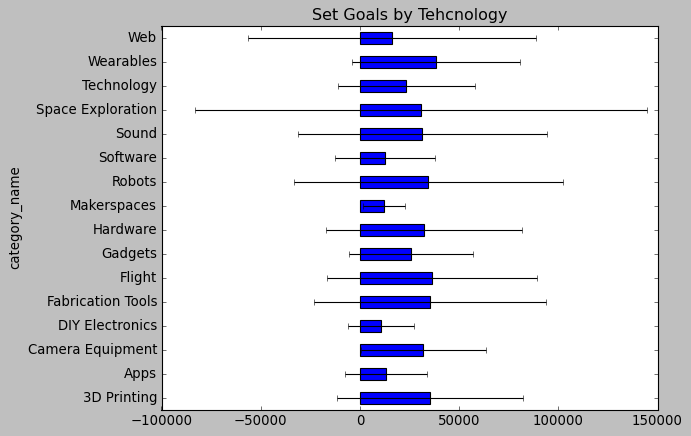

In [134]:
# create df with only successful, technology projects
successful_tech_df = df_US.loc[(df_US['state']==1) & (df_US['category_slug']=='technology')].copy()

# using the successful df defined earlier, create new df grouped by category 
# agg goals
tech_goals_df = successful_tech_df.groupby('category_name')['goal'].agg([np.mean, np.std])

# plot goals with error bars
tech_goals_df.plot(kind= 'barh', y='mean', legend=False,
                 xerr='std', title='Set Goals by Tehcnology')

It seems that the most and least successful technology projects are "Camera Equipment" and "Apps", with success rates of 0.58 and 0.07, respectively. These average goals are generally 35,000 USD and 15,000 USD by the same accord. 

At first glance, it seems that camera equipment is pretty popular among the tech projects. Keep in mind, however, that camera equipment has 58% a success rate in a category that only has a 30% success rate. In this situation, context is crucial to understanding risk and reward. Regarding Apps, my interpretation would be to find a different crowd-sourcing platform where apps are more successful. 

# Conclusion

Overall, the best model performance in this model set was gradient boosting. It had the best performance across the board with 
- Accuracy: 0.76
- Precision: 0.80
- Recall: 0.73

In addition, this model seemed to be less impacted by apparent over-fitting compared to random forest. 
The features of importance plot revealed that Goal and goal_log are both in the model, which should be handled in further iterations, possibly with VIF.

NLP's value might provide contextual benefits from keywords or topics, which can then be added into the other models for potential increase in predictive performance. Additionally, users might find value from NLP derived context. 

## Looking forward:
Given more time and a more powerful work station, the next version of this project should get a bit more attention in the list provided below. Ideally, all of this work would be done before handing this off to the production team or engineers for optimization and productization. These changes will hopefully increase predictive performance and reduce overfitting.

- I would like to break down the features using NLP and also plug them back in to the other models to review performance metrics. 
- More feature engineering with NLP and overall model tuning would be useful before handing this model off to the production team. 
- Implement VIF to reduce multicollinearity.

# Thank you